<a href="https://colab.research.google.com/github/yaniv256/VAEs-in-Economics/blob/master/Time_use_shares_with_vaes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Thu Feb 27 17:11:35 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.48.02    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   70C    P0    36W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
from tensorflow.keras import backend as K   # Use tensorflow.keras
K.clear_session()

In [0]:

from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow import set_random_seed

from numpy.random import seed

import numpy as np

In [0]:
epochs = 2000
batch_size = 256   

In [5]:
import pandas as pd 
df=pd.read_csv("https://github.com/yaniv256/VAEs-in-Economics/blob/master/Data/Timeuse/time_shares_only_2013.csv?raw=true")
df

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,540,330,0,35,0,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,455,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,580,95,0,75,0,35,60,25,15,0,0,0,0,0,50,0,0,80,0,309,20,60,0,0,0,5,0,0,0,0,0,0,0,0,10,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,450,60,0,170,0,90,105,0,20,0,0,0,0,0,0,0,0,0,0,0,15,15,0,0,0,0,0,0,0,0,0,0,0,0,40,0,145,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,450,65,680,70,0,30,0,0,0,0,0,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,570,90,0,120,0,0,60,0,0,0,0,0,0,30,0,0,0,0,0,0,0,0,0,510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [6]:
from sklearn.preprocessing import QuantileTransformer

qt_trans = QuantileTransformer(n_quantiles=1000, random_state=0)
qt = pd.DataFrame(qt_trans.fit_transform(df))
qt.columns = df.columns
qt

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,0.571572,0.831832,0.000000,0.304805,0.000000,0.311311,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.997387,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.693193,0.400901,0.000000,0.646146,0.000000,0.508008,0.825325,0.782282,0.791792,0.000000,0.0,0.000000,0.000000,0.000000,0.919920,0.0,0.000000,0.961962,0.0,0.995862,0.851852,0.958458,0.000000,0.000000,0.0,0.871371,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.877878,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.262262,0.304304,0.000000,0.958959,0.000000,0.903403,0.937437,0.000000,

In [0]:
from sklearn.model_selection import train_test_split 
x_train, x_test = train_test_split(qt, test_size=0.33, random_state=42)
train_examples = x_train.shape[0]
flag_0 = np.zeros((train_examples,1),dtype=x_train.values.dtype)
x_train = np.concatenate((x_train.values,flag_0),axis=-1)
test_examples = x_test.shape[0]
flag_1 = np.ones((test_examples,1),dtype=x_test.values.dtype)
x_test = np.concatenate((x_test.values,flag_1),axis=-1)

In [8]:
!rm -f vaes_net.py
!wget "https://raw.githubusercontent.com/yaniv256/VAEs-in-Economics/master/Notebooks/vaes_net.py"


--2020-02-27 17:11:41--  https://raw.githubusercontent.com/yaniv256/VAEs-in-Economics/master/Notebooks/vaes_net.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10346 (10K) [text/plain]
Saving to: ‘vaes_net.py’

vaes_net.py         100%[===================>]  10.10K  --.-KB/s    in 0s      

2020-02-27 17:11:41 (94.6 MB/s) - ‘vaes_net.py’ saved [10346/10346]



Instructions for updating:
If using Keras pass *_constraint arguments to layers.
(?, 1)
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 390)]        0                                            
__________________________________________________________________________________________________
tf_op_layer_strided_slice_1 (Te [(None, 389)]        0           input_1[0][0]                    
__________________________________________________________________________________________________
gaussian_noise (GaussianNoise)  (None, 389)          0           tf_op_layer_strided_slice_1[0][0]
__________________________________________________________________________________________________
dense (Dense)                   (None, 2048)         800768      gaussian_noise[0][0]             
____

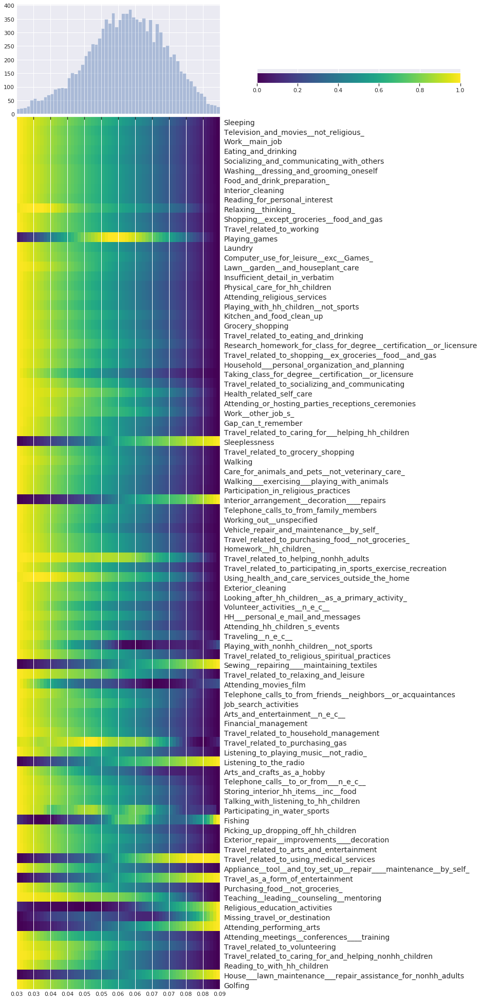

7627/7627 [==============================] - 7s 882us/sample - loss: 0.0169 - val_loss: 0.0159
Epoch 2/333
7627/7627 [==============================] - 1s 80us/sample - loss: 0.0161 - val_loss: 0.0159
Epoch 3/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0160 - val_loss: 0.0158
Epoch 4/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0159 - val_loss: 0.0151
Epoch 5/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0156 - val_loss: 0.0148
Epoch 6/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0153 - val_loss: 0.0145
Epoch 7/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0153 - val_loss: 0.0144
Epoch 8/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0152 - val_loss: 0.0144
Epoch 9/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0151 - val_loss: 0.0142
Epoch 10/333
7627/7627 [==============================] -

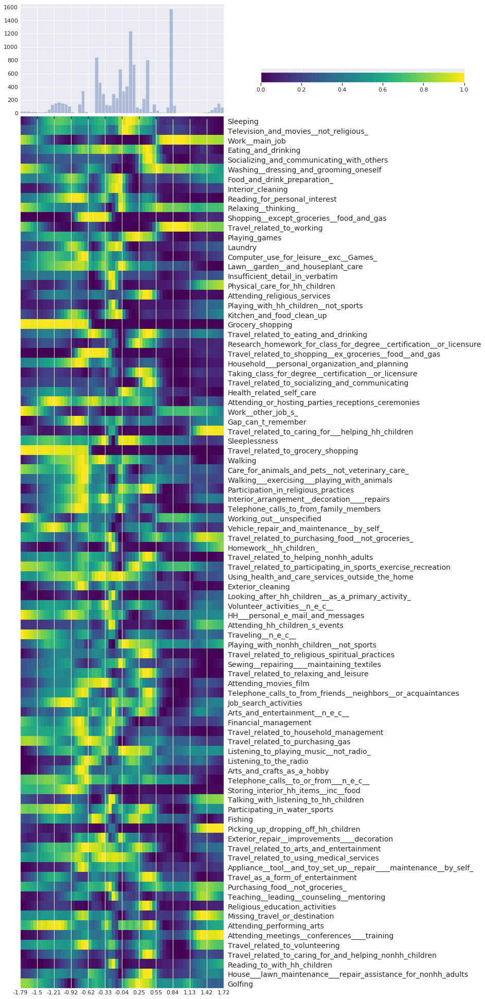

7627/7627 [==============================] - 5s 595us/sample - loss: 0.0142 - val_loss: 0.0129
Epoch 102/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0142 - val_loss: 0.0130
Epoch 103/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0142 - val_loss: 0.0129
Epoch 104/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0142 - val_loss: 0.0130
Epoch 105/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0142 - val_loss: 0.0130
Epoch 106/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0142 - val_loss: 0.0130
Epoch 107/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0142 - val_loss: 0.0129
Epoch 108/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0142 - val_loss: 0.0129
Epoch 109/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0142 - val_loss: 0.0130
Epoch 110/333
7168/7627 [================

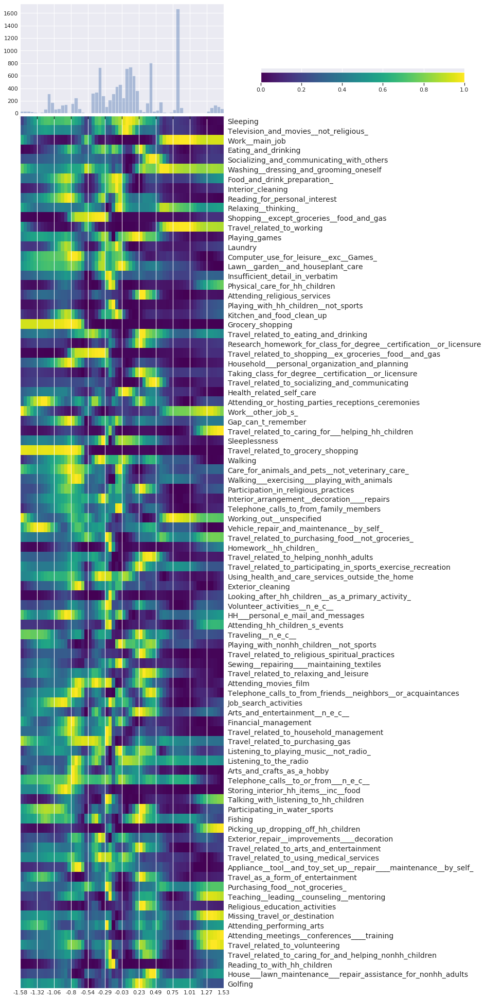

7627/7627 [==============================] - 5s 599us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 202/333
7627/7627 [==============================] - 1s 80us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 203/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 204/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 205/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0141 - val_loss: 0.0127
Epoch 206/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 207/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 208/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0141 - val_loss: 0.0127
Epoch 209/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0141 - val_loss: 0.0128
Epoch 210/333
7627/7627 [================

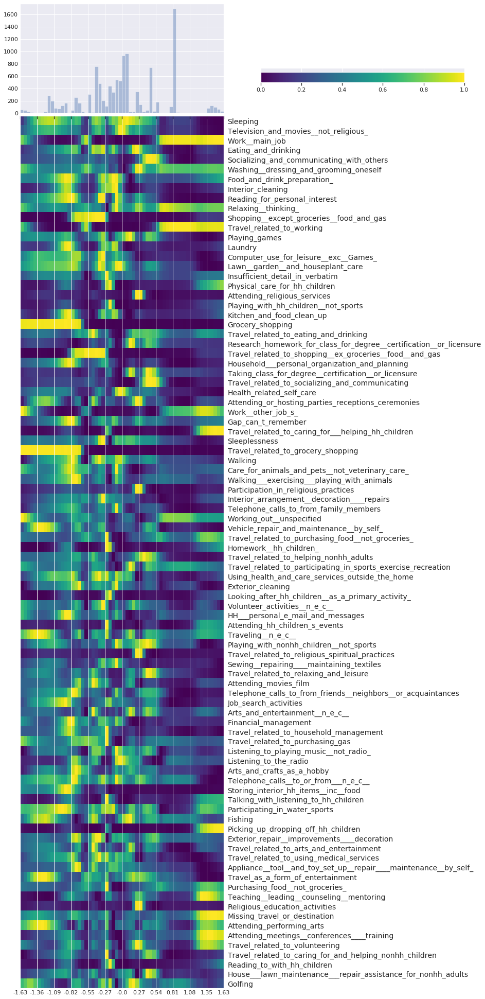

7627/7627 [==============================] - 4s 575us/sample - loss: 0.0140 - val_loss: 0.0126
Epoch 302/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 303/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 304/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 305/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 306/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0125
Epoch 307/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0140 - val_loss: 0.0126
Epoch 308/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0140 - val_loss: 0.0126
Epoch 309/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0140 - val_loss: 0.0126
Epoch 310/333
7627/7627 [================

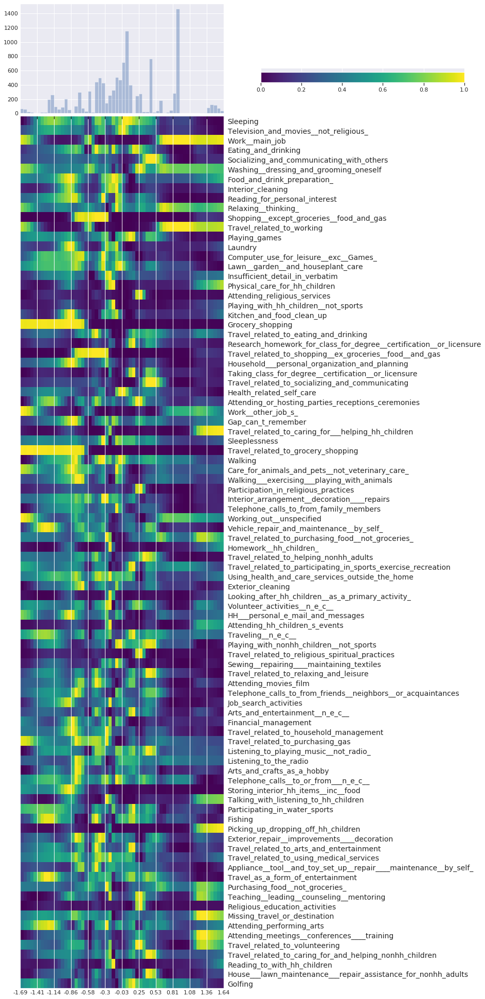

7627/7627 [==============================] - 4s 584us/sample - loss: 0.0139 - val_loss: 0.0125
Epoch 2/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 3/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0139 - val_loss: 0.0125
Epoch 4/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0125
Epoch 5/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 6/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 7/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0139 - val_loss: 0.0125
Epoch 8/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0140 - val_loss: 0.0126
Epoch 9/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0139 - val_loss: 0.0126
Epoch 10/333
7627/7627 [==============================] -

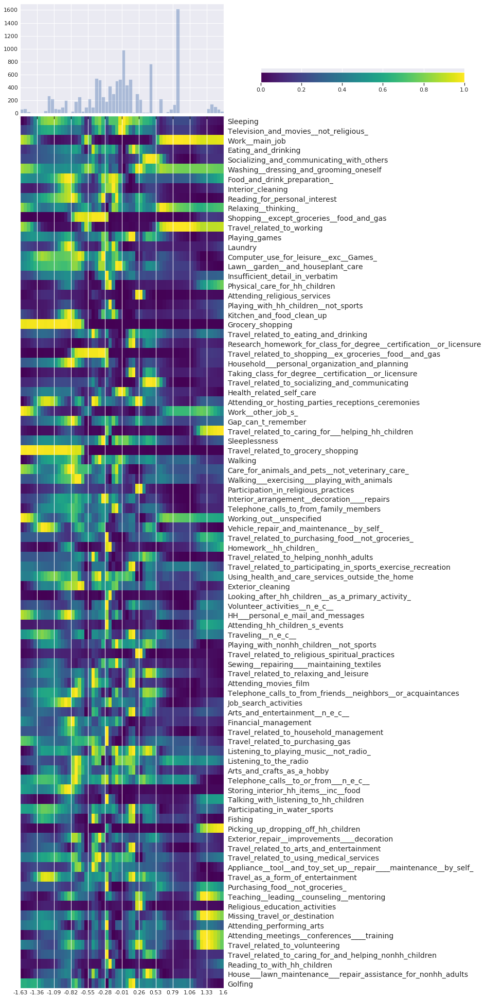

7627/7627 [==============================] - 5s 596us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 102/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 103/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 104/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 105/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 106/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 107/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 108/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 109/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0138 - val_loss: 0.0125
Epoch 110/333
7627/7627 [================

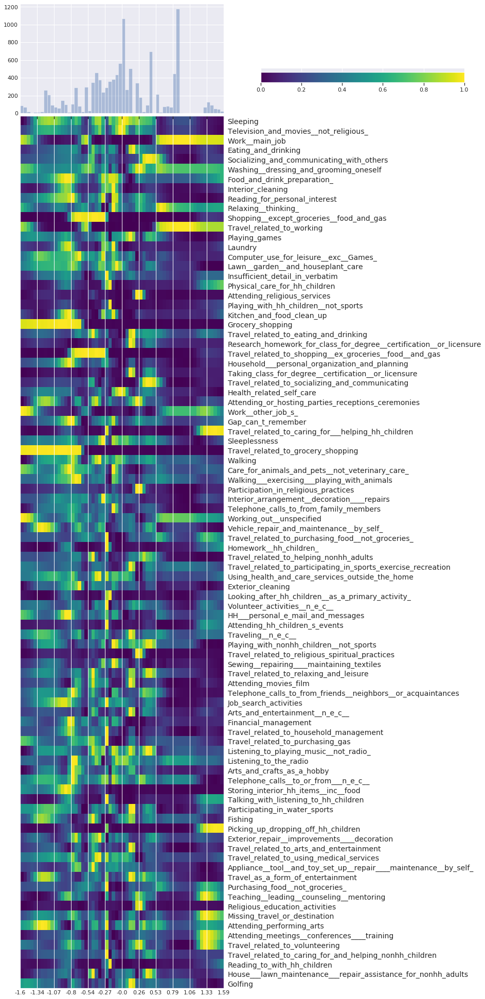

7627/7627 [==============================] - 4s 589us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 202/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 203/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 204/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 205/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 206/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 207/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 208/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 209/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0138 - val_loss: 0.0124
Epoch 210/333
7627/7627 [================

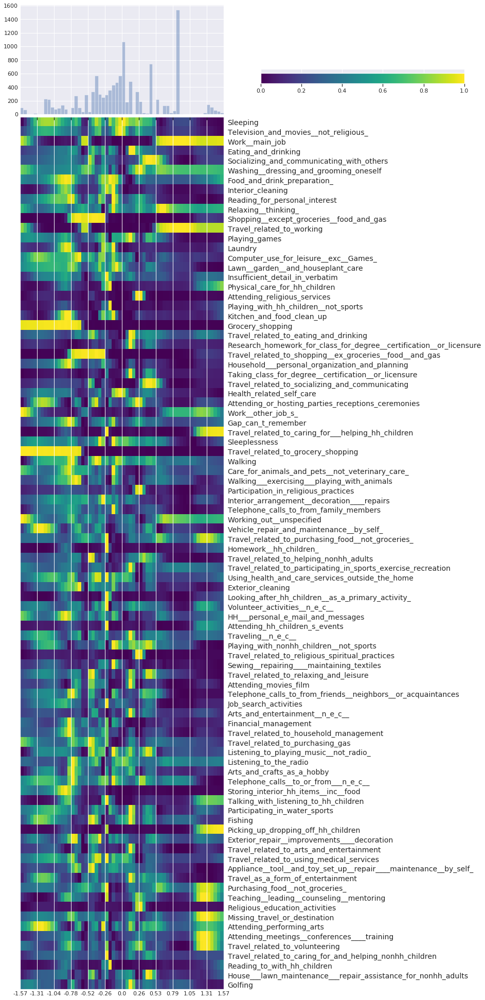

7627/7627 [==============================] - 5s 604us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 302/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 303/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 304/333
7627/7627 [==============================] - 1s 74us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 305/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 306/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 307/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 308/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 309/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 310/333
7627/7627 [================

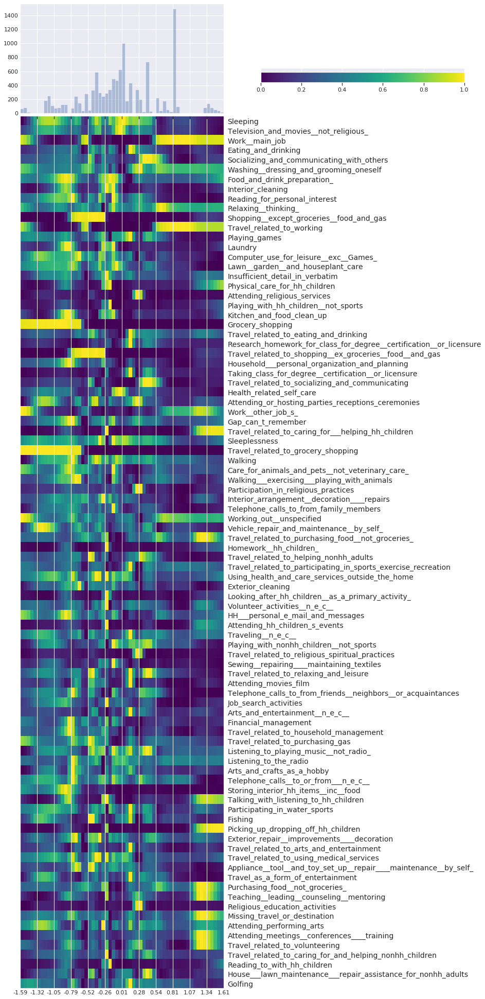

7627/7627 [==============================] - 5s 594us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 2/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 3/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 4/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 5/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 6/333
7627/7627 [==============================] - 1s 74us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 7/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 8/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0137 - val_loss: 0.0124
Epoch 9/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 10/333
7627/7627 [==============================] -

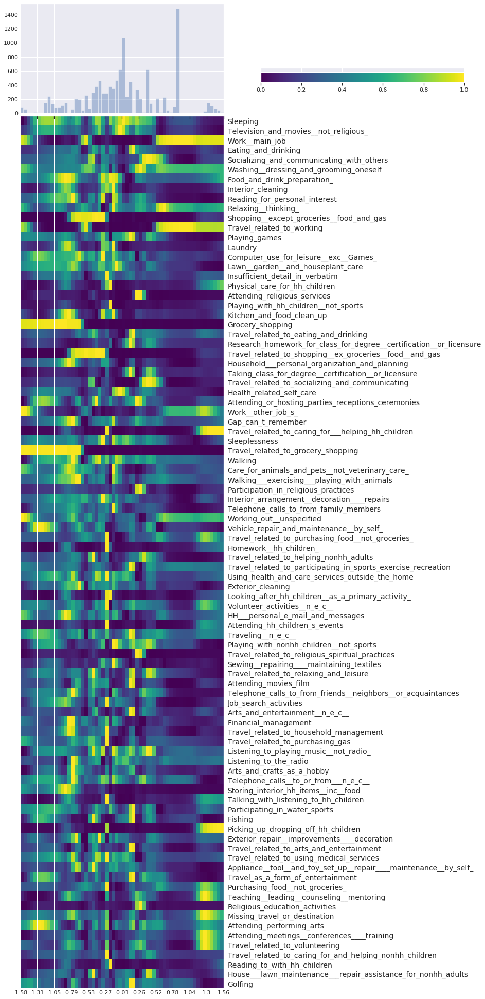

7627/7627 [==============================] - 5s 591us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 102/333
7627/7627 [==============================] - 1s 80us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 103/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 104/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 105/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 106/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 107/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 108/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 109/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 110/333
7627/7627 [================

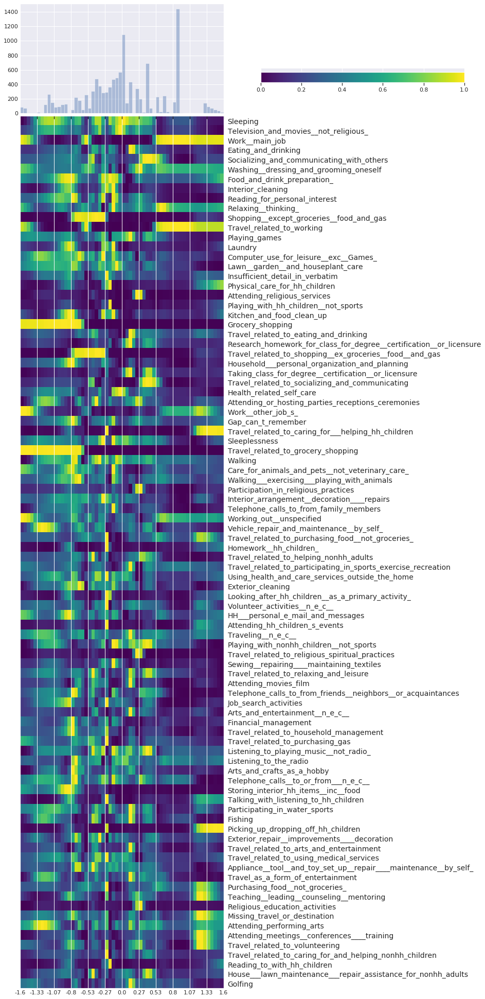

7627/7627 [==============================] - 4s 579us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 202/333
7627/7627 [==============================] - 1s 83us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 203/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 204/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 205/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 206/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 207/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 208/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 209/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 210/333
7627/7627 [================

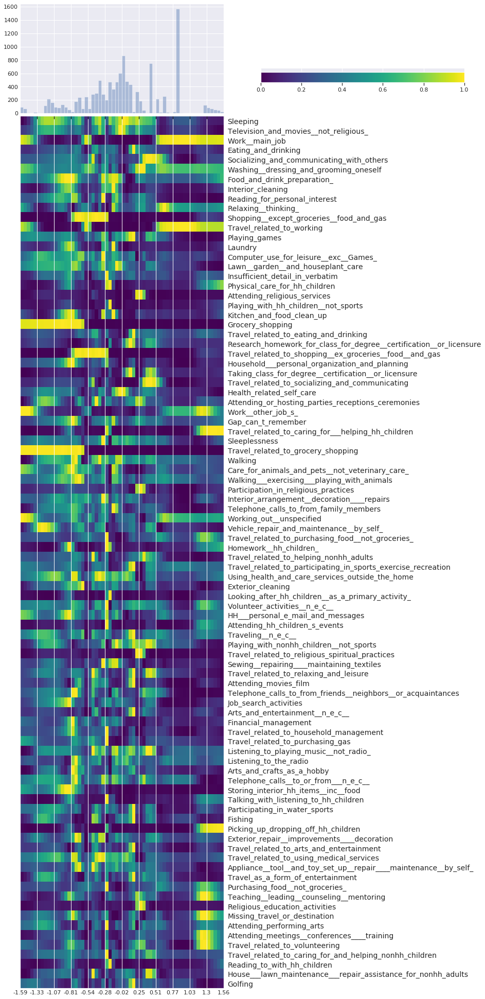

7627/7627 [==============================] - 4s 586us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 302/333
7627/7627 [==============================] - 1s 80us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 303/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 304/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 305/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 306/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 307/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 308/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 309/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0137 - val_loss: 0.0123
Epoch 310/333
7627/7627 [================

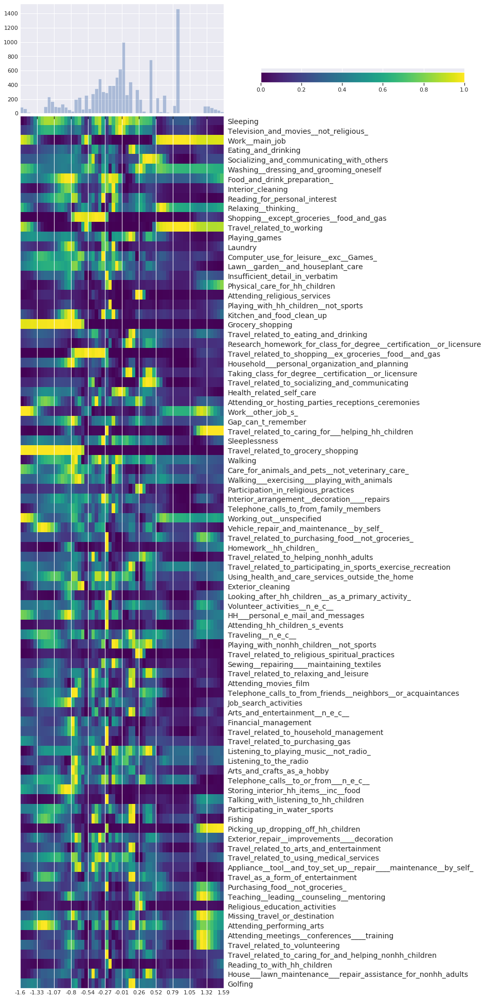

7627/7627 [==============================] - 5s 617us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 2/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 3/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 4/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 5/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 6/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 7/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 8/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 9/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 10/333
7627/7627 [==============================] -

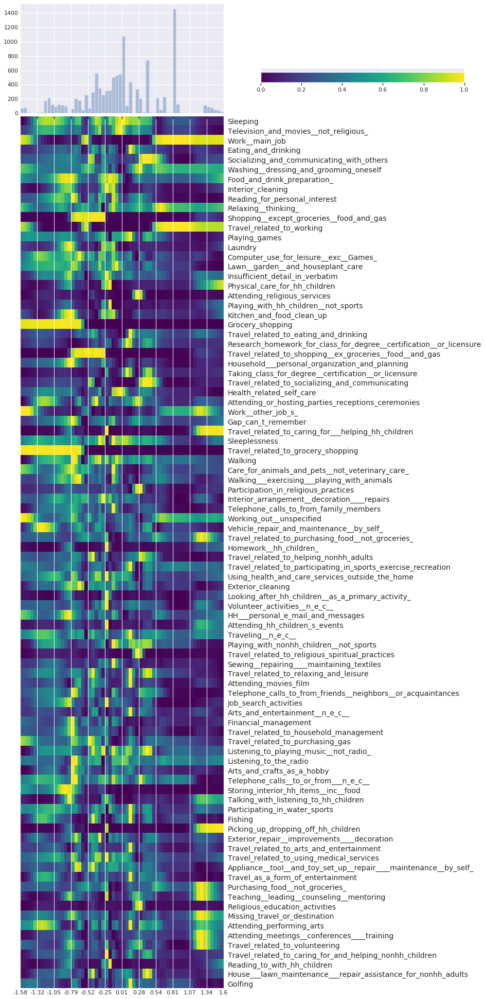

7627/7627 [==============================] - 4s 581us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 102/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 103/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 104/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 105/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 106/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 107/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 108/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 109/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 110/333
7627/7627 [================

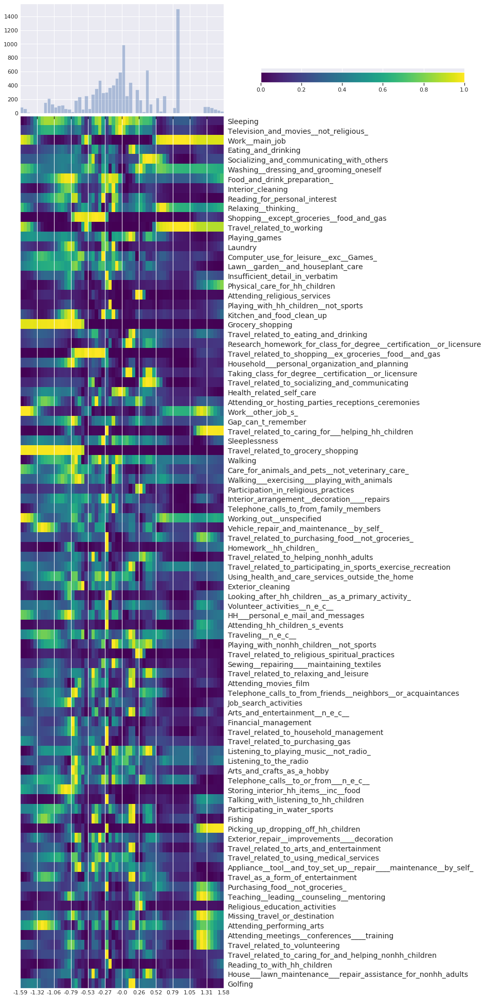

7627/7627 [==============================] - 5s 592us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 202/333
7627/7627 [==============================] - 1s 81us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 203/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 204/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 205/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 206/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 207/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 208/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 209/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 210/333
7627/7627 [================

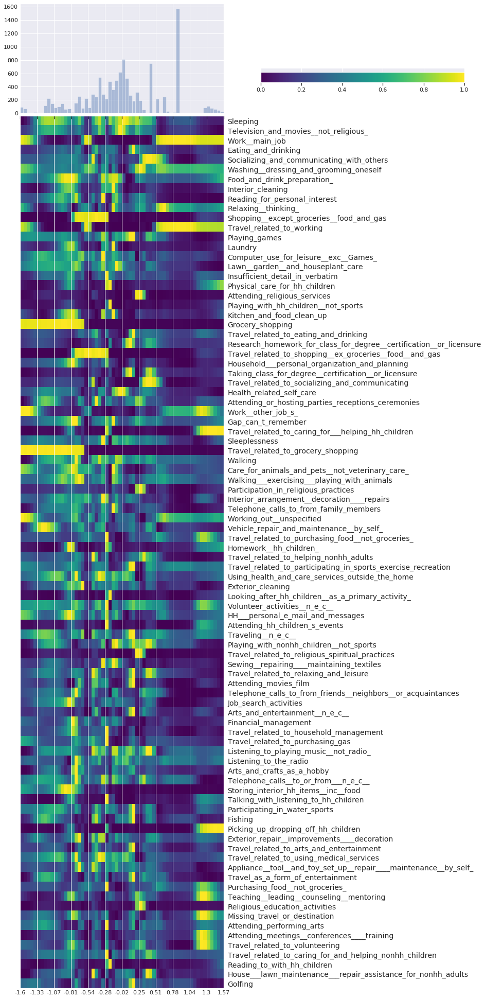

7627/7627 [==============================] - 4s 586us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 302/333
7627/7627 [==============================] - 1s 81us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 303/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 304/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 305/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 306/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 307/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 308/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 309/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 310/333
7627/7627 [================

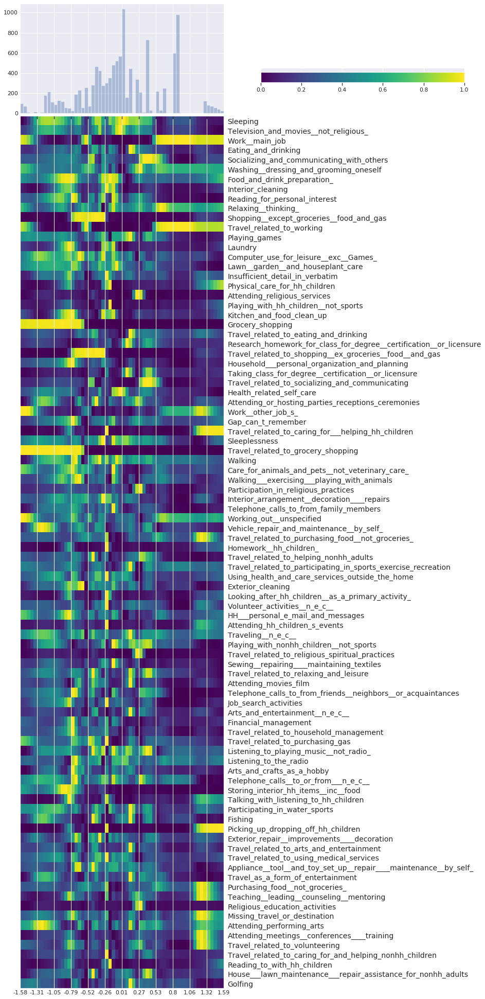

7627/7627 [==============================] - 4s 569us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 2/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 3/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 4/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 5/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 6/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 7/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 8/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 9/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 10/333
7627/7627 [==============================] -

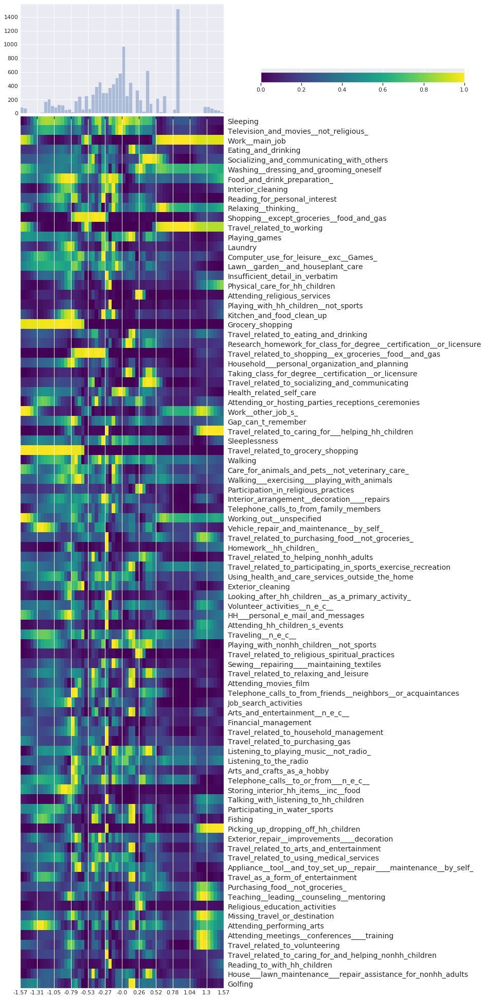

7627/7627 [==============================] - 5s 598us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 102/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 103/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 104/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 105/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 106/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 107/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 108/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 109/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 110/333
7627/7627 [================

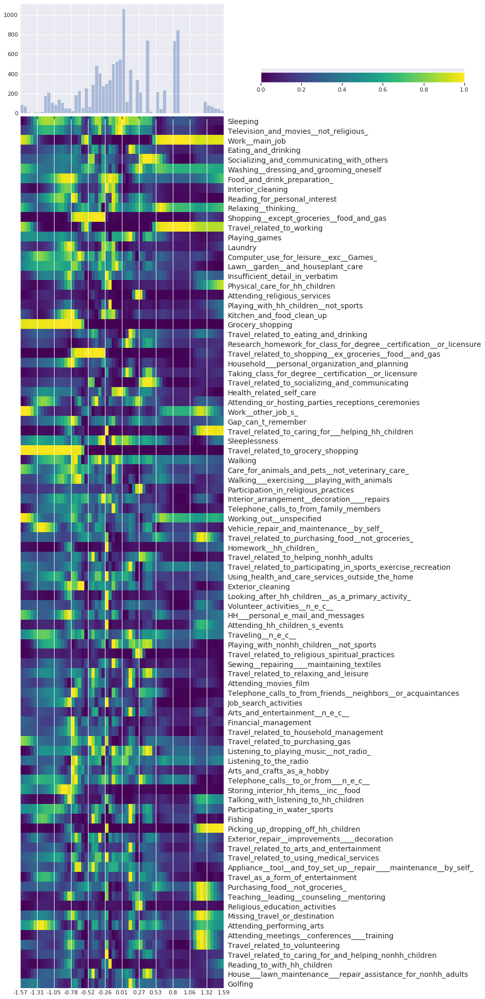

7627/7627 [==============================] - 4s 572us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 202/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 203/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 204/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 205/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 206/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 207/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 208/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 209/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 210/333
7627/7627 [================

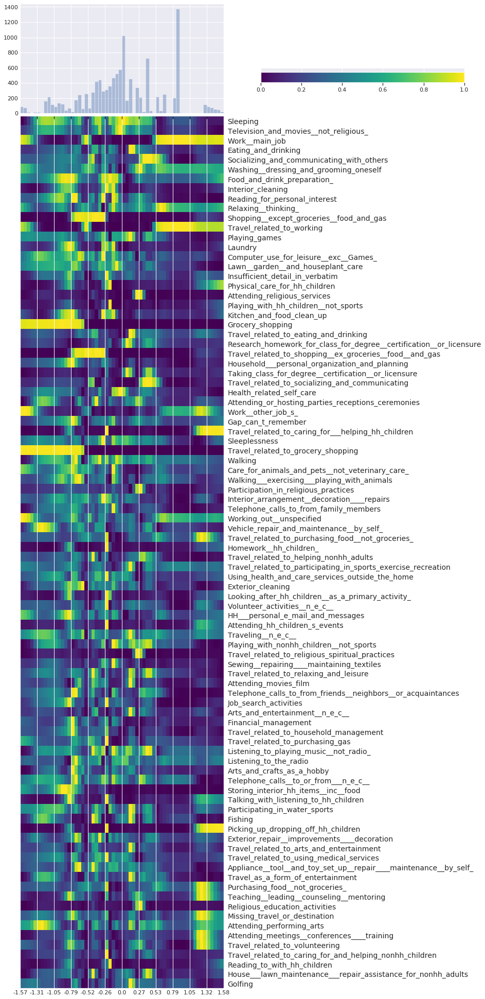

7627/7627 [==============================] - 4s 583us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 302/333
7627/7627 [==============================] - 1s 80us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 303/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 304/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 305/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 306/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 307/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 308/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 309/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 310/333
7627/7627 [================

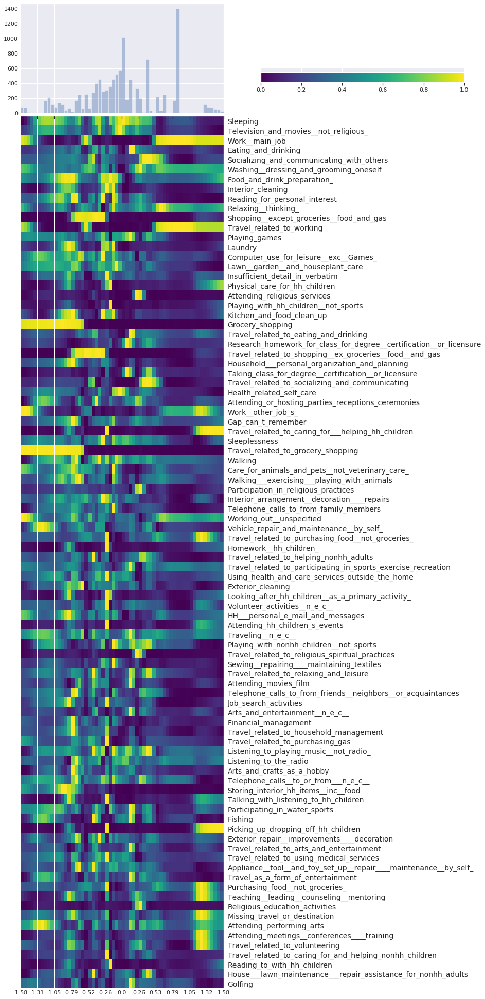

7627/7627 [==============================] - 4s 580us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 2/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 3/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 4/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 5/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 6/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 7/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 8/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 9/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 10/333
7627/7627 [==============================] -

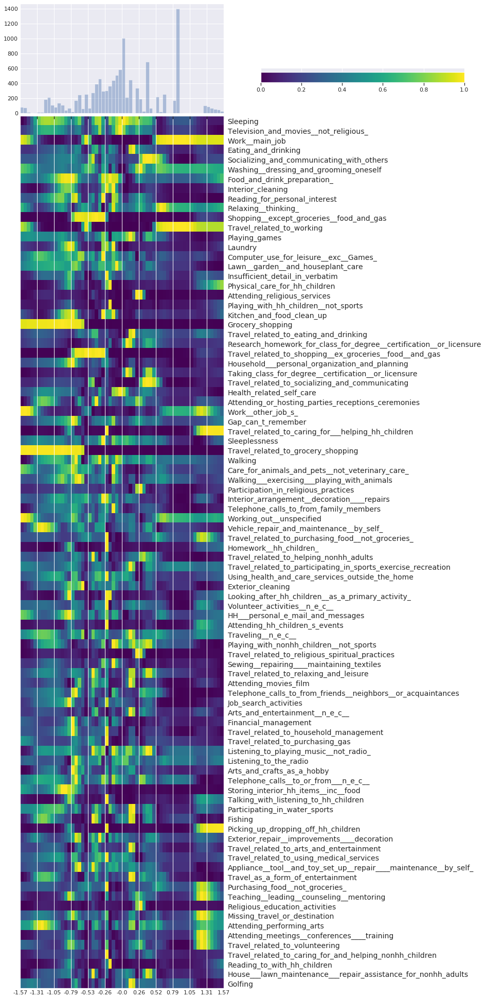

7627/7627 [==============================] - 4s 576us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 102/333
7627/7627 [==============================] - 1s 81us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 103/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 104/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 105/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 106/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 107/333
7627/7627 [==============================] - 1s 75us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 108/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 109/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 110/333
7627/7627 [================

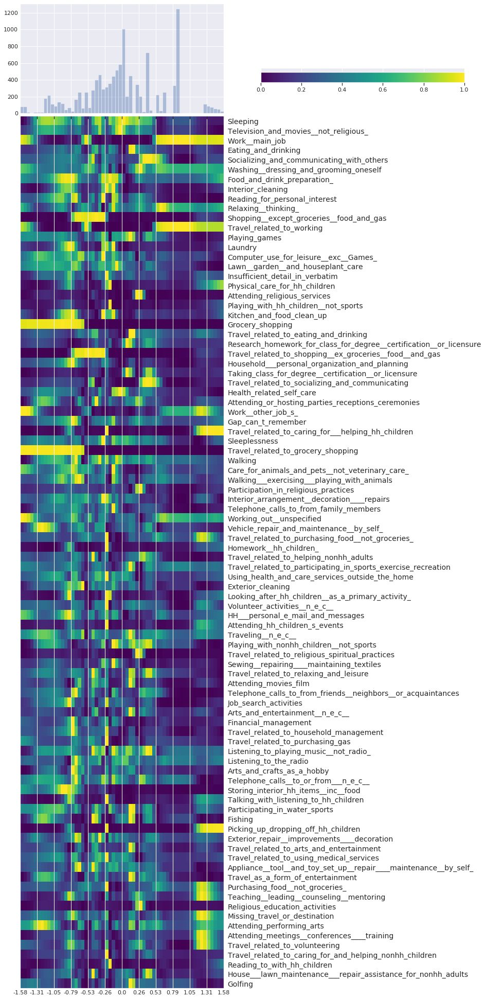

7627/7627 [==============================] - 5s 602us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 202/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 203/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 204/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 205/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 206/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 207/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 208/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 209/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 210/333
7627/7627 [================

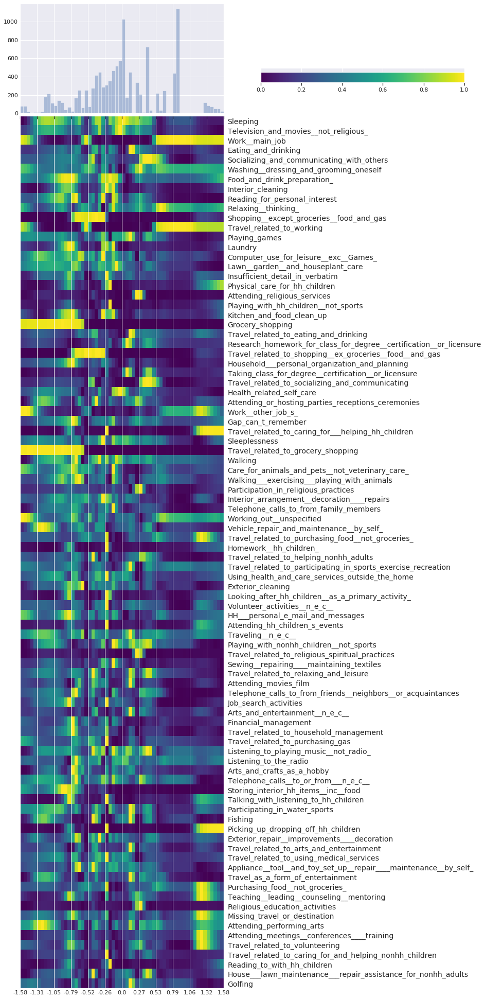

7627/7627 [==============================] - 4s 585us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 302/333
7627/7627 [==============================] - 1s 82us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 303/333
7627/7627 [==============================] - 1s 79us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 304/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0122
Epoch 305/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 306/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 307/333
7627/7627 [==============================] - 1s 77us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 308/333
7627/7627 [==============================] - 1s 76us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 309/333
7627/7627 [==============================] - 1s 78us/sample - loss: 0.0136 - val_loss: 0.0123
Epoch 310/333
7627/7627 [================

In [9]:
from vaes_net import make_vae, plot_types
seed(42)
set_random_seed(42)
vae = make_vae(full_data=qt,  
    img_shape = (389+1, ),
    latent_dim = 1, 
    dense_width = 2048,
    l2_penalty=0.000000000001,
    l1_penalty=0.0,
    encoder_dropout_rate=0.5,
    decoder_dropout_rate=0.001,
    entanglement_penalty = 2,
    hidden_n = 3)  

vae.summary()

n_starts = 6

for i in range(0,n_starts):

  print("Round number: ", i+1)

  fitted = vae.fit(
      x=x_train, 
      y=None,
      shuffle=True,
      epochs=round(epochs/n_starts),
      batch_size=batch_size,
      validation_data=(x_test, None),
      callbacks = vae.callback_list
      )

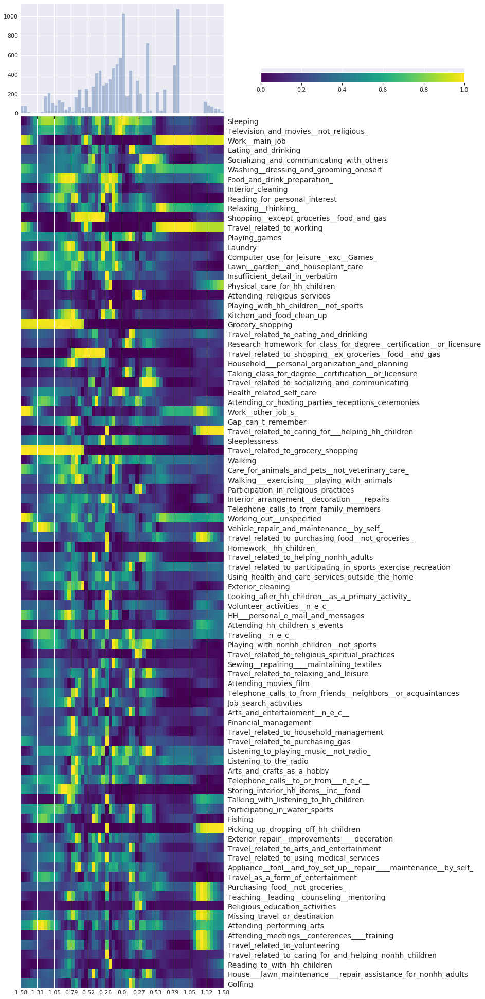

In [10]:
plot_types(encoder=vae.encoder,decoder=vae.decoder,data=qt);

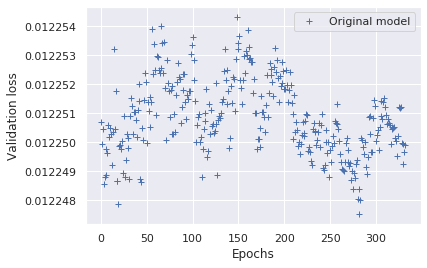

In [11]:

val_loss1 = fitted.history['val_loss']
#val_loss2 = fitted2.history['val_loss']
epochs_grid = range(0, np.shape(val_loss1)[0])

import matplotlib.pyplot as plt

# b+ is for "blue cross"
plt.plot(epochs_grid, val_loss1, 'b+', label='Original model')
# "bo" is for "blue dot"
#plt.plot(epochs_grid, val_loss2, 'bo', label='Alternative model')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend()

plt.show()

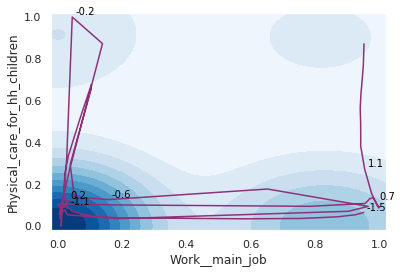

In [12]:
from vaes_net import encode_plot2d
  
encode_plot2d(encoder=vae.encoder,decoder=vae.decoder, 
              data=vae.full_data)

In [13]:

flag_1 = np.ones((qt.shape[0],1),dtype=qt.values.dtype)
data = np.concatenate((qt.values,flag_1),axis=-1)
encoded_data=vae.encoder.predict(data)
pd.DataFrame(encoded_data)

,0
0,0.037856
1,-0.914743
2,-0.983689
3,0.841313
4,-0.032160
...,...
11380,-0.025420
11381,0.639480
11382,0.639599
11383,0.050083


In [14]:
from sklearn.preprocessing import MinMaxScaler

filtered=pd.DataFrame((vae.decoder.predict(encoded_data)))
scaler = MinMaxScaler()
filtered=pd.DataFrame(scaler.fit_transform(filtered))  
filtered.columns = df.columns
filtered

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,0.993816,0.860418,0.005191,0.328187,0.136539,0.047909,0.097375,0.075922,0.164238,0.490982,0.010366,0.003141,0.757605,0.081851,0.074551,0.467751,0.354244,0.037742,0.003226,0.023291,0.031362,0.008136,0.013445,0.663012,0.008653,0.104347,0.551810,0.013898,0.840762,0.385289,0.075190,0.287615,0.030746,0.740675,0.008728,0.541052,0.365683,0.276551,0.248641,0.400452,...,0.175373,0.464948,0.170363,0.529075,0.327573,0.139538,0.109996,0.347596,0.434889,0.517955,0.293824,0.555284,0.124211,0.252411,0.986755,0.119598,0.483888,0.666705,0.251113,0.267841,0.024918,0.369334,0.404506,0.657483,0.654706,0.411720,0.149059,0.584725,0.559501,0.249740,0.461806,0.269127,0.108517,0.549001,0.416896,0.428964,0.661693,0.107320,0.472202,0.954959
1,0.837886,0.687923,0.036941,0.578115,0.442365,0.453900,0.882435,0.768598,0.385447,0.576981,0.001299,0.010683,0.651768,0.638083,0.124913,0.654944,0.402823,0.334444,0.066361,0.132660,0.662073,1.000000,0.174858,0.169394,0.001995,0.373954,0.106619,0.231151,0.4219

In [0]:
# for field in filtered.columns[0:29]:
    
#      encode_plot2d(vae.encoder,vae.decoder, qt, y_col=field)

In [16]:
filtered-qt

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,0.422244,0.028586,0.005191,0.023382,0.136539,-0.263403,0.097375,0.075922,0.164238,0.490982,0.010366,0.003141,0.757605,0.081851,0.074551,0.467751,0.354244,0.037742,0.003226,0.023291,0.031362,0.008136,0.013445,-0.334375,0.008653,0.104347,0.551810,0.013898,0.840762,0.385289,0.075190,0.287615,0.030746,0.740675,0.008728,0.541052,0.365683,0.276551,0.248641,0.400452,...,0.175373,0.464948,0.170363,0.529075,0.327573,0.139538,0.109996,0.347596,0.434889,0.517955,0.293824,0.555284,0.124211,0.252411,0.986755,0.119598,0.483888,0.666705,0.251113,0.267841,0.024918,0.369334,0.404506,0.657483,0.654706,0.411720,0.149059,0.584725,0.559501,0.249740,0.461806,0.269127,0.108517,0.549001,0.416896,0.428964,0.661693,0.107320,0.472202,0.954959
1,0.144693,0.287022,0.036941,-0.068031,0.442365,-0.054108,0.057110,-0.013684,-0.406344,0.576981,0.001299,0.010683,0.651768,0.638083,-0.795007,0.654944,0.402823,-0.627518,0.066361,-0.863202,-0.189778,0.041542,0.174858,0.169394,0.001995,-0.497417,0.106619,0.23

In [0]:
pd.DataFrame(encoded_data).to_csv("encoded_data.csv", header=False, index=False)


In [0]:
vae.encoder.save_weights('encoder')

In [0]:
vae.decoder.save_weights('decoder')

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [21]:
!ls "/content/drive/My Drive/VAEs-in-Economics/Resources"

decoder.data-00000-of-00002
decoder.data-00001-of-00002
decoder.index
encoded_data.csv
encoder.data-00000-of-00002
encoder.data-00001-of-00002
encoder.index
EqualSizedBins.png
PaintedStones.png
type_plot.png
VAE.png
VAE.pptx
Work__main_job_Attending_religious_services.png
Work__main_job_Computer_use_for_leisure__exc__Games_.png
Work__main_job_Eating_and_drinking.png
Work__main_job_Food_and_drink_preparation_.png
Work__main_job_Grocery_shopping.png
Work__main_job_Health_related_self_care.png
Work__main_job_Household___personal_organization_and_planning.png
Work__main_job_Insufficient_detail_in_verbatim.png
Work__main_job_Interior_cleaning.png
Work__main_job_Kitchen_and_food_clean_up.png
Work__main_job_Laundry.png
Work__main_job_Lawn__garden__and_houseplant_care.png
Work__main_job_Physical_care_for_hh_children.png
Work__main_job_Playing_games.png
Work__main_job_Playing_with_hh_children__not_sports.png
Work__main_job_Reading_for_personal_interest.png
Work__main_job_Relaxing__thinking_.png

In [0]:
!cp *.png "/content/drive/My Drive/VAEs-in-Economics/Resources"

In [0]:
!cp *.csv "/content/drive/My Drive/VAEs-in-Economics/Resources"

In [0]:
!cp encoder.* "/content/drive/My Drive/VAEs-in-Economics/Resources"

In [0]:
!cp decoder.* "/content/drive/My Drive/VAEs-in-Economics/Resources"